In [1]:
import pickle
import pumpp
import numpy as np
import librosa
import os

import tensorflow as tf
import keras as K
import pescador
import pandas as pd

from sklearn.cross_validation import LabelShuffleSplit

Using TensorFlow backend.


In [2]:
SEED = 20170319

In [3]:
DATA_DIR = '/home/bmcfee/working/chords/pump'

In [4]:
# Reload the pump
with open('/home/bmcfee/working/chords/pump.pkl', 'rb') as fd:
    pump = pickle.load(fd)

In [395]:
# Calculate the number of frames

MAX_SAMPLES = 32

duration = 10

pump.ops[0].sr

n_frames = librosa.time_to_frames(duration,
                                  sr=pump.ops[0].sr,
                                  hop_length=pump.ops[0].hop_length)[0]

sampler = pump.sampler(MAX_SAMPLES, n_frames)

In [396]:
n_frames

107

In [397]:
def data_sampler(fname, sampler):

    data = np.load(fname)
    d2 = dict(data)
    data.close
    data = d2
    
    yield from sampler(data)

In [398]:
def data_generator(tracks, sampler, k, batch_size=16, **kwargs):
    
    seeds = []
    for track in tracks:
        fname = os.path.join(DATA_DIR, os.path.extsep.join([track, 'npz']))
        
        seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
    # Send it all to a mux
    mux = pescador.Mux(seeds, k, **kwargs)
    
    if batch_size == 1:
        return mux
    else:
        return pescador.BufferedStreamer(mux, batch_size)

# Construct the model

In [399]:
pump.fields

{'chord_struct/bass': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_struct/pitch': Tensor(shape=(None, 12), dtype=<class 'bool'>),
 'chord_struct/root': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_tag/chord': Tensor(shape=(None, 170), dtype=<class 'bool'>),
 'cqt/mag': Tensor(shape=(None, 288, 1), dtype=<class 'numpy.float32'>)}

In [400]:
len(pump.ops[1].vocabulary())

170

In [401]:
x = pump.layers()['cqt/mag']

b = K.layers.BatchNormalization()(x)

c0 = K.layers.Convolution2D(1, (5, 5), padding='same', activation='relu',
                            data_format='channels_last')(b)

c1 = K.layers.Convolution2D(64, (1, int(c0.shape[2])), padding='valid', activation='relu',
                            data_format='channels_last')(c0)

r1 = K.layers.Lambda(lambda x: K.backend.squeeze(x, axis=2))(c1)

rs = K.layers.Bidirectional(K.layers.GRU(64, return_sequences=True))(r1)

p1 = K.layers.TimeDistributed(K.layers.Dense(pump.fields['chord_tag/chord'].shape[1],
                                             activation='softmax'))(rs)

model = K.models.Model(x, p1)

# Run a train-test split

In [402]:
index = pd.read_json('/home/bmcfee/working/chords/artist_index.json', typ='series')

for train_, test in LabelShuffleSplit(list(index), n_iter=1, random_state=SEED):
    idx_train_ = index.iloc[train_]
    idx_test = index.iloc[test]
    for train, val in LabelShuffleSplit(list(idx_train_), n_iter=1, test_size=0.25, random_state=SEED):
        idx_train = idx_train_.iloc[train]
        idx_val = idx_train_.iloc[val]
    
        gen_train = data_generator(idx_train.index, sampler, 512, lam=32, batch_size=16, revive=True, random_state=SEED)
        
        gen_val = data_generator(idx_val.index, sampler, len(idx_val), batch_size=16, revive=True, random_state=SEED)
        

        model.compile(K.optimizers.Adam(), 'categorical_crossentropy', metrics=['accuracy'])

        model.fit_generator(gen_train.tuples('cqt/mag', 'chord_tag/chord'), 256, 100,
                            validation_data=gen_val.tuples('cqt/mag', 'chord_tag/chord'),
                            validation_steps=256,
                            callbacks=[K.callbacks.ModelCheckpoint('/home/bmcfee/working/chords/model_simple_ckpt.pkl'),
                                       K.callbacks.ReduceLROnPlateau(verbose=1, patience=10),
                                       K.callbacks.EarlyStopping(patience=20, verbose=1)])

Epoch 1/100
256/256 [==============================] - 109s - loss: 3.8816 - acc: 0.1201 - val_loss: 3.5068 - val_acc: 0.2381
Epoch 2/100
256/256 [==============================] - 104s - loss: 3.0301 - acc: 0.3090 - val_loss: 2.6761 - val_acc: 0.4013
Epoch 3/100
256/256 [==============================] - 105s - loss: 2.2757 - acc: 0.4418 - val_loss: 2.0237 - val_acc: 0.5160
Epoch 4/100
256/256 [==============================] - 108s - loss: 1.8715 - acc: 0.5159 - val_loss: 1.8670 - val_acc: 0.5284
Epoch 5/100
256/256 [==============================] - 103s - loss: 1.6952 - acc: 0.5488 - val_loss: 1.7761 - val_acc: 0.5385
Epoch 6/100
256/256 [==============================] - 104s - loss: 1.5577 - acc: 0.5747 - val_loss: 1.6212 - val_acc: 0.5700
Epoch 7/100
256/256 [==============================] - 103s - loss: 1.4589 - acc: 0.5965 - val_loss: 1.6034 - val_acc: 0.5665
Epoch 8/100
256/256 [==============================] - 102s - loss: 1.4643 - acc: 0.5936 - val_loss: 1.5081 - val_acc:

# Diagnostics

In [403]:
import pandas as pd

In [404]:
import jams.display
import matplotlib.pyplot as plt
%matplotlib nbagg
import librosa.display

<IPython.core.display.Javascript object>


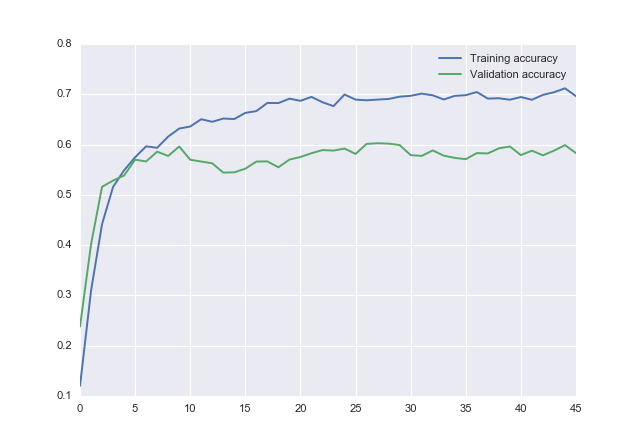

In [405]:
history = pd.DataFrame.from_dict(model.history.history)
plt.figure()

plt.plot(history['acc'], label='Training accuracy')
plt.plot(history['val_acc'], label='Validation accuracy')
plt.legend(loc='best')

In [406]:
l1 = model.get_weights()[4].squeeze()

<IPython.core.display.Javascript object>


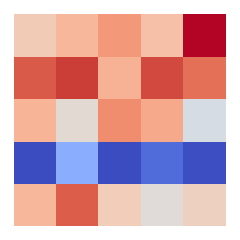

In [407]:
plt.figure(figsize=(3,3))

librosa.display.specshow(l1.T, vmin=l1.min(), vmax=l1.max())
    
plt.tight_layout()

In [408]:
l2 = model.get_weights()[6].squeeze()
l2 = librosa.util.axis_sort(l2)

<IPython.core.display.Javascript object>


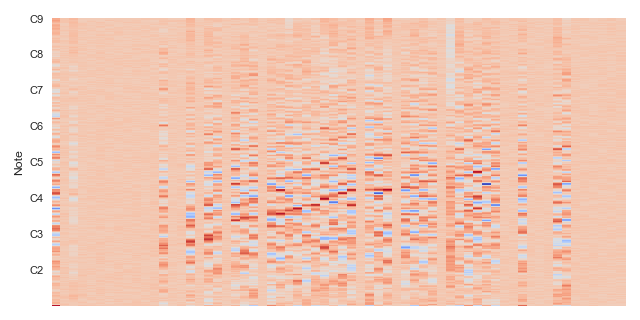

In [409]:
plt.figure(figsize=(8,4))
librosa.display.specshow(l2, y_axis='cqt_note', sr=pump.ops[0].sr, bins_per_octave=36)
plt.tight_layout()

---
# Validation viz

In [410]:
import pandas as pd
import jams

from tqdm import tqdm_notebook as tqdm

In [411]:
def score_model(pump, model, idx,
                features='/home/bmcfee/working/chords/pump',
                refs='/home/bmcfee/data/eric_chords/references_v2/'):
    
    results = {}
    for item in tqdm(idx.index):
        jam = jams.load('{}/{}.jams'.format(refs, item), validate=False)
        datum = np.load('{}/{}.npz'.format(features, item))['cqt/mag']
        
        ann = pump.ops[1].inverse(model.predict(datum)[0])
        results[item] = jams.eval.chord(jam.annotations['chord', 0], ann)
        
    return pd.DataFrame.from_dict(results, orient='index')

In [412]:
df = score_model(pump, model, idx_test)

In [423]:
df.describe().loc['mean']

thirds          0.735318
thirds_inv      0.697274
triads          0.692692
triads_inv      0.661307
tetrads         0.560142
tetrads_inv     0.535968
root            0.771317
mirex           0.778021
majmin          0.757119
majmin_inv      0.721196
sevenths        0.623494
sevenths_inv    0.595066
Name: mean, dtype: float64

In [414]:
F = idx_val.index[15]

In [415]:
F

'TRBAFVO149E33A9195'

In [416]:
datum = np.load('/home/bmcfee/working/chords/pump/{}.npz'.format(F))

In [417]:
J = jams.load('/home/bmcfee/data/eric_chords/references_v2/{}.jams'.format(F))

In [418]:
ann_true = pump.ops[1].inverse(datum['chord_tag/chord'][0])

In [419]:
ann = pump.ops[1].inverse(model.predict(datum['cqt/mag'])[0])

In [420]:
pd.DataFrame.from_records([jams.eval.chord(J.annotations['chord', 0], ann)]).loc[0]

majmin          0.742373
majmin_inv      0.723570
mirex           0.765514
root            0.752202
sevenths        0.608148
sevenths_inv    0.598829
tetrads         0.561458
tetrads_inv     0.552925
thirds          0.710067
thirds_inv      0.692514
triads          0.697623
triads_inv      0.680071
Name: 0, dtype: float64

<IPython.core.display.Javascript object>


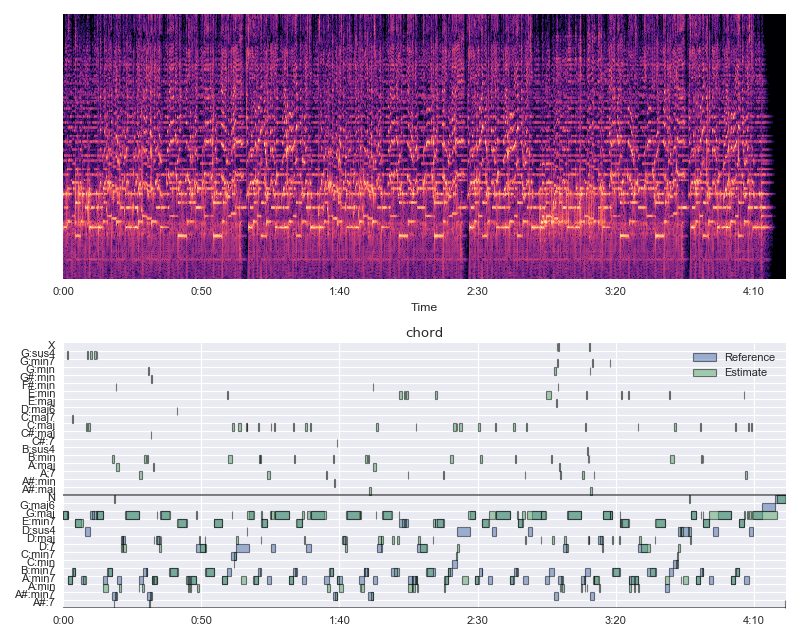

In [421]:
plt.figure(figsize=(10, 8))

ax = plt.subplot(2,1,1)
librosa.display.specshow(datum['cqt/mag'][0, :, :, 0].T,
                         sr=pump.ops[0].sr,
                         hop_length=pump.ops[0].hop_length,
                         x_axis='time')

plt.subplot(2,1,2, sharex=ax)
jams.display.display(ann_true, meta=False, label='Reference', alpha=0.5)
jams.display.display(ann, meta=False, label='Estimate', alpha=0.5)
plt.legend()
plt.tight_layout()

In [173]:
from IPython.display import Audio

In [174]:
import jams

In [175]:
import librosa

In [176]:
y, sr = librosa.load('/home/bmcfee/data/eric_chords/audio/{}.mp3'.format(F))

In [177]:
Audio(data=y + jams.sonify.sonify(ann, sr=sr, duration=len(y) / sr), rate=sr)